<a href="https://colab.research.google.com/github/kotharisanjana/CMPE255_DataMining_Fall2022/blob/main/Pycaret_BinaryClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Installations 

In [ ]:
!pip install pycaret --user
!pip install Jinja2==2.11.3
!pip install markupsafe==2.0.1
!pip install opendatasets
!pip install gradio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 320 kB 5.2 MB/s 
     |████████████████████████████████| 134 kB 51.5 MB/s 
     |████████████████████████████████| 1.7 MB 47.1 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 1.3 MB 53.7 MB/s 
     |████████████████████████████████| 2.0 MB 52.9 MB/s 
     |████████████████████████████████| 88 kB 9.3 MB/s 
     |████████████████████████████████| 6.8 MB 51.4 MB/s 
     |████████████████████████████████| 25.9 MB 1.4 MB/s 
     |████████████████████████████████| 56 kB 6.4 MB/s 
     |████████████████████████████████| 167 kB 77.6 MB/s 
     |████████████████████████████████| 636 kB 60.7 MB/s 
     |████████████████████████████████| 17.0 MB 78.0 MB/s 
     |████████████████████████████████| 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 6.1 MB 5.0 MB/s 
     |████████████████████████████████| 54 kB 4.2 MB/s 
     |████████████████████████████████| 112 kB 70.8 MB/s 
     |████████████████████████████████| 84 kB 4.3 MB/s 
     |████████████████████████████████| 270 kB 72.7 MB/s 
     |████████████████████████████████| 55 kB 4.6 MB/s 
     |████████████████████████████████| 212 kB 77.5 MB/s 
     |████████████████████████████████| 84 kB 4.5 MB/s 
     |████████████████████████████████| 57 kB 7.0 MB/s 
     |████████████████████████████████| 2.3 MB 54.5 MB/s 
     |█████████████████████████████

## Kaggle API credentials

In [ ]:
!gdown 12ixZGdrcwr_c4nVnjVEonFJLiFrbBzsD

Downloading...
From: https://drive.google.com/uc?id=12ixZGdrcwr_c4nVnjVEonFJLiFrbBzsD
To: /content/kaggle.json
100% 65.0/65.0 [00:00<00:00, 113kB/s]


## Imports

In [ ]:
import opendatasets as od
import pandas as pd
from pycaret.classification import *
import pandas_profiling as pp 

## Download dataset

In [ ]:
od.download('https://www.kaggle.com/datasets/mssmartypants/rice-type-classification')

100%|██████████| 888k/888k [00:00<00:00, 35.1MB/s]

In [ ]:
df = pd.read_csv('/content/rice-type-classification/riceClassification.csv')

## Exploratory Data Analysis

In [ ]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Split training and test set

In [ ]:
df = df.drop(['id'], axis = 1)

In [ ]:
train = df.sample(frac = 0.8, random_state = 786)
test = df.drop(train.index)

print('Data for Modeling: ' + str(train.shape))
print('Unseen Data For Predictions: ' + str(test.shape))

Data for Modeling: (14548, 11)
Unseen Data For Predictions: (3637, 11)


##  Data Manipulation

In [ ]:
classification = setup(data = train, \
                       session_id = 1, \
                       target = 'Class', \
                       normalize = True, \
                       transformation = True, \
                       remove_multicollinearity = True, \
                       group_features = [['ConvexArea', 'EquivDiameter']], \
                       feature_selection = True, \
                       use_gpu = True
                       )

INFO:logs:PyCaret Supervised Module
INFO:logs:ML Usecase: classification
INFO:logs:version 2.3.10
INFO:logs:Initializing setup()
INFO:logs:setup(target=Class, ml_usecase=classification, available_plots={'parameter': 'Hyperparameters', 'auc': 'AUC', 'confusion_matrix': 'Confusion Matrix', 'threshold': 'Threshold', 'pr': 'Precision Recall', 'error': 'Prediction Error', 'class_report': 'Class Report', 'rfe': 'Feature Selection', 'learning': 'Learning Curve', 'manifold': 'Manifold Learning', 'calibration': 'Calibration Curve', 'vc': 'Validation Curve', 'dimension': 'Dimensions', 'feature': 'Feature Importance', 'feature_all': 'Feature Importance (All)', 'boundary': 'Decision Boundary', 'lift': 'Lift Chart', 'gain': 'Gain Chart', 'tree': 'Decision Tree', 'ks': 'KS Statistic Plot'}, train_size=0.7, test_data=None, preprocess=True, imputation_type=simple, iterative_imputation_iters=5, categorical_features=None, categorical_imputation=constant, categorical_iterative_imputer=lightgbm, ordinal_f

IntProgress(value=0, description='Processing: ', max=3)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,20:38:53
Status,. . . . . . . . . . . . . . . . . .,Preprocessing Data


INFO:logs:Importing libraries
INFO:logs:Copying data for preprocessing
INFO:logs:Declaring preprocessing parameters
INFO:logs:Creating preprocessing pipeline
INFO:logs:Preprocessing pipeline created successfully
ERROR:logs:(Process Exit): setup has been interupted with user command 'quit'. setup must rerun.
INFO:logs:Creating global containers
INFO:logs:Internal pipeline: Pipeline(memory=None, steps=[('empty_step', 'passthrough')], verbose=False)


Text(value="Following data types have been inferred automatically, if they are correct press enter to continue…

,Data Type
Area,Numeric
MajorAxisLength,Numeric
MinorAxisLength,Numeric
Eccentricity,Numeric
ConvexArea,Numeric
EquivDiameter,Numeric
Extent,Numeric
Perimeter,Numeric
Roundness,Numeric
AspectRation,Numeric


KeyboardInterrupt: ignored

## Models

In [ ]:
models = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9889,0.9979,0.9918,0.9881,0.9899,0.9776,0.9776,1.455
gbc,Gradient Boosting Classifier,0.9885,0.9975,0.9925,0.9867,0.9895,0.9768,0.9768,2.017
lightgbm,Light Gradient Boosting Machine,0.9885,0.9988,0.9921,0.9870,0.9895,0.9768,0.9768,0.135
et,Extra Trees Classifier,0.9882,0.9981,0.9909,0.9877,0.9893,0.9762,0.9762,1.176
knn,K Neighbors Classifier,0.9880,0.9952,0.9903,0.9878,0.9891,0.9758,0.9758,0.110
ada,Ada Boost Classifier,0.9875,0.9988,0.9910,0.9863,0.9886,0.9748,0.9749,0.496
ridge,Ridge Classifier,0.9871,0.0000,0.9919,0.9847,0.9883,0.9740,0.9741,0.019
lda,Linear Discriminant Analysis,0.9871,0.9983,0.9919,0.9847,0.9883,0.9740,0.9741,0.059
svm,SVM - Linear Kernel,0.9866,0.0000,0.9937,0.9821,0.9879,0.9730,0.9731,0.018
qda,Quadratic Discriminant Analysis,0.9865,0.9984,0.9964,0.9794,0.9878,0.9728,0.9730,0.014


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=1, verbose=0,
                       warm_start=False)
INFO:logs:compare_models() succesfully completed......................................


## Model creation

In [ ]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9843,0.9970,0.9928,0.9788,0.9858,0.9683,0.9684
1,0.9912,0.9996,0.9928,0.9911,0.9919,0.9822,0.9822
2,0.9902,0.9994,0.9875,0.9946,0.9910,0.9802,0.9802
3,0.9892,0.9971,0.9928,0.9875,0.9902,0.9782,0.9782
4,0.9902,0.9992,0.9946,0.9875,0.9911,0.9802,0.9802
5,0.9843,0.9933,0.9892,0.9822,0.9857,0.9683,0.9683
6,0.9862,0.9990,0.9928,0.9822,0.9875,0.9722,0.9723
7,0.9931,0.9983,0.9964,0.9911,0.9937,0.9861,0.9861
8,0.9912,0.9965,0.9892,0.9946,0.9919,0.9822,0.9822


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=1, verbose=0,
                       warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
gbc = create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9833,0.9968,0.9910,0.9788,0.9849,0.9663,0.9664
1,0.9921,0.9994,0.9946,0.9911,0.9928,0.9841,0.9842
2,0.9892,0.9996,0.9892,0.9910,0.9901,0.9782,0.9782
3,0.9912,0.9981,0.9946,0.9893,0.9919,0.9821,0.9822
4,0.9872,0.9932,0.9928,0.9840,0.9884,0.9742,0.9743
5,0.9833,0.9939,0.9892,0.9804,0.9848,0.9663,0.9663
6,0.9862,0.9992,0.9946,0.9805,0.9875,0.9722,0.9723
7,0.9941,0.9984,0.9982,0.9911,0.9946,0.9881,0.9881
8,0.9912,0.9992,0.9892,0.9946,0.9919,0.9822,0.9822


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 6
INFO:logs:GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=1, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)
INFO:logs:create_model() succesfully completed......................................


## Model tuning

In [ ]:
tuned_rf = tune_model(rf, optimize = 'AUC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9853,0.9986,0.9928,0.9805,0.9866,0.9703,0.9703
1,0.9921,0.9996,0.9946,0.9911,0.9928,0.9841,0.9842
2,0.9921,0.9993,0.9910,0.9946,0.9928,0.9842,0.9842
3,0.9921,0.9976,0.9946,0.9911,0.9928,0.9841,0.9841
4,0.9882,0.9993,0.9910,0.9875,0.9892,0.9762,0.9762
5,0.9843,0.9977,0.9892,0.9822,0.9857,0.9683,0.9683
6,0.9872,0.9992,0.9946,0.9823,0.9884,0.9742,0.9743
7,0.9912,0.9987,0.9946,0.9893,0.9919,0.9821,0.9822
8,0.9921,0.9985,0.9910,0.9946,0.9928,0.9841,0.9841


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=4, max_features=1.0, max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0001,
                       min_impurity_split=None, min_samples_leaf=2,
                       min_samples_split=10, min_weight_fraction_leaf=0.0,
                       n_estimators=90, n_jobs=-1, oob_score=False,
                       random_state=1, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


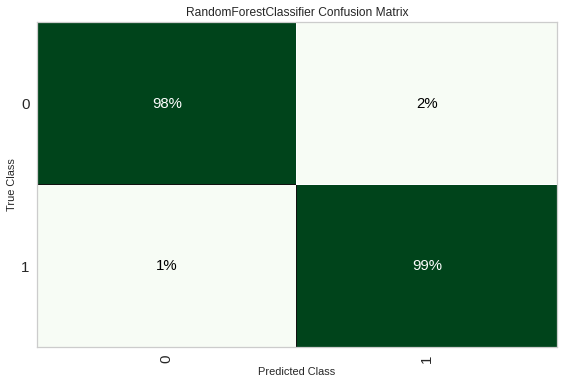

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_rf, plot = 'confusion_matrix', plot_kwargs = {'percent' : True})

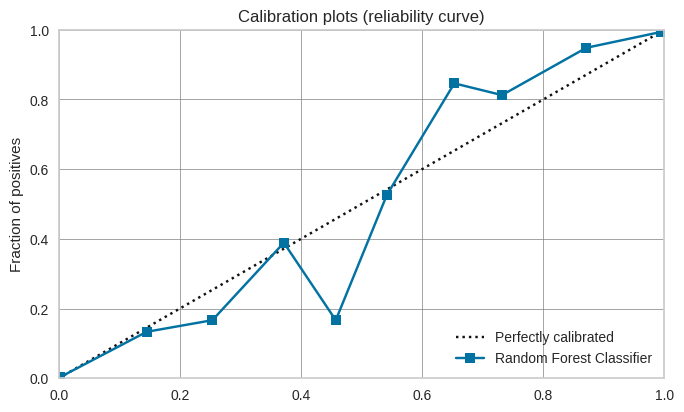

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_rf, plot = 'calibration')

In [ ]:
tuned_gbc = tune_model(gbc, optimize = 'AUC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5476,0.9985,1.0,0.5476,0.7077,0.0,0.0
1,0.5476,0.9995,1.0,0.5476,0.7077,0.0,0.0
2,0.5476,0.9996,1.0,0.5476,0.7077,0.0,0.0
3,0.5472,0.9976,1.0,0.5472,0.7073,0.0,0.0
4,0.5472,0.9993,1.0,0.5472,0.7073,0.0,0.0
5,0.5472,0.9972,1.0,0.5472,0.7073,0.0,0.0
6,0.5472,0.9991,1.0,0.5472,0.7073,0.0,0.0
7,0.5472,0.9987,1.0,0.5472,0.7073,0.0,0.0
8,0.5481,0.9989,1.0,0.5481,0.7081,0.0,0.0


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 7
INFO:logs:GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=1e-06, loss='deviance', max_depth=9,
                           max_features='sqrt', max_leaf_nodes=None,
                           min_impurity_decrease=0.0005,
                           min_impurity_split=None, min_samples_leaf=1,
                           min_samples_split=5, min_weight_fraction_leaf=0.0,
                           n_estimators=170, n_iter_no_change=None,
                           presort='deprecated', random_state=1, subsample=0.65,
                           tol=0.0001, validation_fraction=0.1, verbose=0,
                           warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


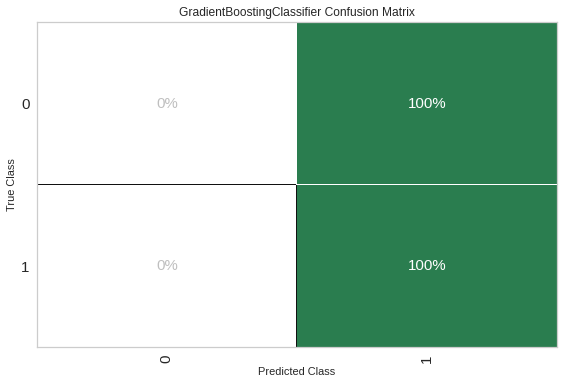

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_gbc, plot = 'confusion_matrix', plot_kwargs = {'percent' : True})

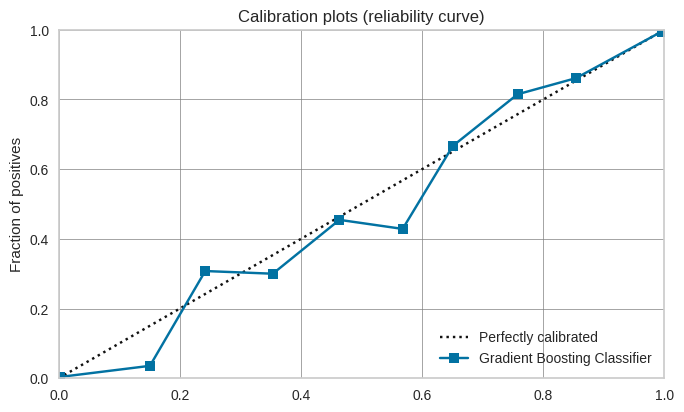

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_gbc, plot = 'calibration')

## Prediction on test set


In [ ]:
pred_rf = predict_model(tuned_rf, data = test)

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=4, max_features=1.0, max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0001,
                       min_impurity_split=None, min_samples_leaf=2,
                       min_samples_split=10, min_weight_fraction_leaf=0.0,
                       n_estimators=90, n_jobs=-1, oob_score=False,
                       random_state=1, verbose=0, warm_start=False), probability_threshold=None, encoded_labels=False, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.CLASSIFICATION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.9871,0.9985,0.9881,0.9886,0.9883,0.9738,0.9738


In [ ]:
pred_gbc = predict_model(tuned_gbc, data = test)

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=1e-06, loss='deviance', max_depth=9,
                           max_features='sqrt', max_leaf_nodes=None,
                           min_impurity_decrease=0.0005,
                           min_impurity_split=None, min_samples_leaf=1,
                           min_samples_split=5, min_weight_fraction_leaf=0.0,
                           n_estimators=170, n_iter_no_change=None,
                           presort='deprecated', random_state=1, subsample=0.65,
                           tol=0.0001, validation_fraction=0.1, verbose=0,
                           warm_start=False), probability_threshold=None, encoded_labels=False, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.CLASSIFICATION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Prel

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.5546,0.9984,1.0,0.5546,0.7135,0.0,0.0


## Gradio

In [ ]:
create_app(tuned_rf)

INFO:logs:Initializing get_config()
INFO:logs:get_config(variable=data_before_preprocess)
INFO:logs:Global variable: data_before_preprocess returned as        Area  MajorAxisLength  MinorAxisLength  Eccentricity  ConvexArea  \
12056  8089       149.193693        69.997391      0.883107        8315   
5519   7016       131.008240        70.133073      0.844641        7246   
16796  9161       164.927981        71.429765      0.901347        9448   
5523   5952       150.821246        50.967513      0.941170        6149   
352    5172       125.395904        53.302087      0.905160        5331   
...     ...              ...              ...           ...         ...   
10503  6787       134.594057        64.996731      0.875670        6953   
11701  7371       141.794395        66.997541      0.881332        7479   
478    5085       126.601065        51.666111      0.912936        5213   
8693   6023       157.109344        49.607147      0.948843        6165   
6921   5923       154.0

Colab notebook detected. To show errors in colab notebook, set `debug=True` in `launch()`
Running on public URL: https://22805.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces: https://huggingface.co/spaces


(<gradio.routes.App at 0x7f03c661b8d0>,
 'http://127.0.0.1:7860/',
 'https://22805.gradio.app')